In [ ]:
# %matplotlib inline

In [4]:
import time
import os
import copy
import numpy as np
import matplotlib.pyplot as plt
from data_loader import pytorch_dataloader
from data_cleaning import data_cleaning
import torch
import torchvision as tv
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import PIL
import random
import seaborn as sn
import pandas as pd

plt.ion() 

In [6]:
data_cleaning(moeimouto=False, self_collected=True)

[STATUS] copying pics in data_set\self-collected\002_0_tohsaka_rin_official to data_set\modeling_data\tohsaka_rin
[STATUS] 002_0_tohsaka_rin_official copy work finished
[STATUS] copying pics in data_set\self-collected\003_0_mato_sakura_official to data_set\modeling_data\mato_sakura
[STATUS] 003_0_mato_sakura_official copy work finished
[STATUS] copying pics in data_set\self-collected\004_0_illyasviel_von_einzbern_official to data_set\modeling_data\illyasviel_von_einzbern
[STATUS] 004_0_illyasviel_von_einzbern_official copy work finished
[STATUS] copying pics in data_set\self-collected\005_0_rider_medusa_official to data_set\modeling_data\rider_medusa
[STATUS] 005_0_rider_medusa_official copy work finished
[STATUS] copying pics in data_set\self-collected\006_0_misaka_mikoto_official to data_set\modeling_data\misaka_mikoto
[STATUS] 006_0_misaka_mikoto_official copy work finished
[STATUS] copying pics in data_set\self-collected\007_0_violet_evergarden_official to data_set\modeling_data\vi

In [2]:
mean = [0.485, 0.456, 0.406]
# std = [0.229, 0.224, 0.225]
# mean = [0,0,0]
std = [1, 1, 1]
pic_size = (256,224)
loader_gen = pytorch_dataloader(mean = mean, std = std)
img_transform = tv.transforms.Compose([
                tv.transforms.Resize(pic_size),
                tv.transforms.RandomHorizontalFlip(),
                tv.transforms.ToTensor(),
                tv.transforms.Normalize(mean, std)
            ])
dataloaders, dataset_sizes, character_names, img_transform = loader_gen.gen_loader(data_transforms=img_transform, batch_size=8)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device: {}".format(device))

Character names: ['aika_granzchesta', 'aisaka_taiga', 'akihime_sumomo', 'akiyama_mio', 'akizuki_ritsuko', 'alice_margatroid', 'allen_walker', 'amami_haruka', 'ana_coppola', 'andou_mahoro', 'arcueid_brunestud', 'asagiri_mai', 'asahina_mikuru', 'asakura_otome', 'asakura_yume', 'ayanami_rei', 'ayasaki_hayate', 'belldandy', 'black_rock_shooter', 'c.c', 'canal_volphied', 'caro_ru_lushe', 'chii', 'cirno', 'corticarte_apa_lagranges', 'daidouji_tomoyo', 'enma_ai', 'erio_mondial', 'fate_testarossa', 'feena_fam_earthlight', 'flandre_scarlet', 'fujibayashi_kyou', 'fukuzawa_yumi', 'furude_rika', 'furukawa_nagisa', 'fuyou_kaede', 'golden_darkness', 'hakurei_reimu', 'hatsune_miku', 'hayama_mizuki', 'hayase_mitsuki', 'hiiragi_kagami', 'hiiragi_tsukasa', 'hinamori_amu', 'hirasawa_yui', 'horo', 'houjou_reika', 'houjou_satoko', 'ibuki_fuuko', 'ichinose_kotomi', 'ikari_shinji', 'illyasviel_von_einzbern', 'ito_chika', 'ito_nobue', 'izayoi_sakuya', 'izumi_konata', 'kagamine_len', 'kagamine_rin', 'kagurazak

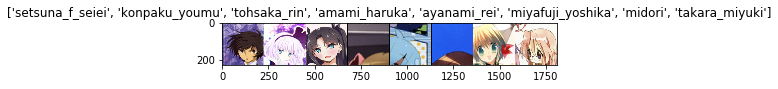

In [4]:
inputs, classes = next(iter(dataloaders['train']))
out = tv.utils.make_grid(inputs)

loader_gen.loader_display(out, title=[character_names[x] for x in classes])

In [5]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'test']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [6]:
models = {
    'rn18' : tv.models.resnet18(pretrained=True)
#     'rn34' : tv.models.resnet34(pretrained=True),
#     'rn50' : tv.models.resnet50(pretrained=True),
#     'rn101' : tv.models.resnet101(pretrained=True)
}
for key in models.keys():
    model = models[key]
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, len(character_names))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    # Observe that all parameters are being optimized
    optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
    # Decay LR by a factor of 0.1 every 7 epochs
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
    print("[STATUS] start training model: {}".format(key))
    model = train_model(model, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=25)

[STATUS] start training model: rn18
Epoch 0/24
----------
train Loss: 3.3472 Acc: 0.2844
test Loss: 1.7373 Acc: 0.5734

Epoch 1/24
----------
train Loss: 1.6929 Acc: 0.6045
test Loss: 1.0647 Acc: 0.7196

Epoch 2/24
----------
train Loss: 1.1877 Acc: 0.7167
test Loss: 0.8468 Acc: 0.7758

Epoch 3/24
----------
train Loss: 0.9760 Acc: 0.7612
test Loss: 0.7751 Acc: 0.7972

Epoch 4/24
----------
train Loss: 0.8463 Acc: 0.7893
test Loss: 0.6743 Acc: 0.8246

Epoch 5/24
----------
train Loss: 0.7453 Acc: 0.8134
test Loss: 0.6507 Acc: 0.8278

Epoch 6/24
----------
train Loss: 0.6714 Acc: 0.8316
test Loss: 0.6273 Acc: 0.8348

Epoch 7/24
----------
train Loss: 0.5484 Acc: 0.8662
test Loss: 0.5353 Acc: 0.8562

Epoch 8/24
----------
train Loss: 0.5317 Acc: 0.8706
test Loss: 0.5117 Acc: 0.8667

Epoch 9/24
----------
train Loss: 0.5090 Acc: 0.8742
test Loss: 0.5341 Acc: 0.8571

Epoch 10/24
----------
train Loss: 0.4924 Acc: 0.8800
test Loss: 0.4684 Acc: 0.8736

Epoch 11/24
----------
train Loss: 0.48

In [11]:
def random_visualization(model):
    model.eval()
    modeling_data_path = os.path.join('data_set', 'modeling_data')
    characters_folders = os.listdir(modeling_data_path)
    for character in characters_folders:
        pic_folder = os.path.join(modeling_data_path, character)
        all_pics = os.listdir(pic_folder)
        sampling = random.choices(all_pics, k=1)
        for pic in sampling:
            pic_dir = os.path.join(pic_folder, pic)
            raw_img = PIL.Image.open(pic_dir).convert('RGB')
            img = img_transform(raw_img).float()
            img = torch.autograd.Variable(img, requires_grad=True)
            img = img.unsqueeze(0).cuda()
            outputs = model(img)
            _, preds = torch.max(outputs, 1)
            pred_result = character_names[preds[0]]
            plt.imshow(raw_img)
            plt.title("Prediction: {}, Truth: {}, Corret: {}".format(pred_result, character, pred_result == character))
            plt.show()

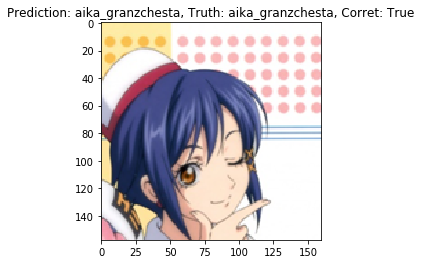

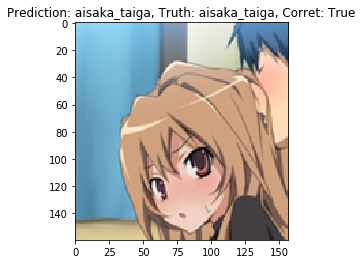

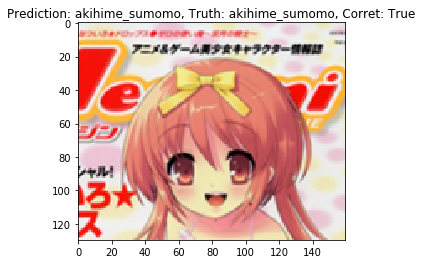

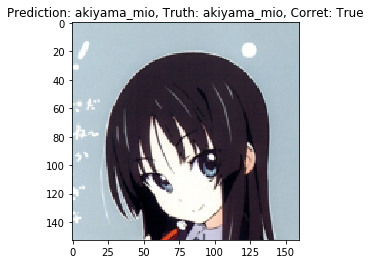

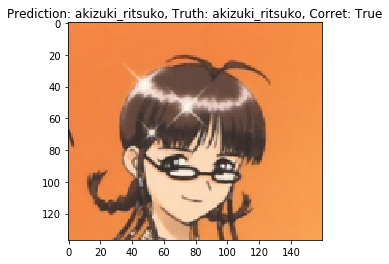

...

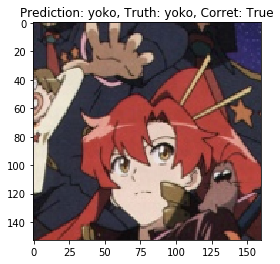

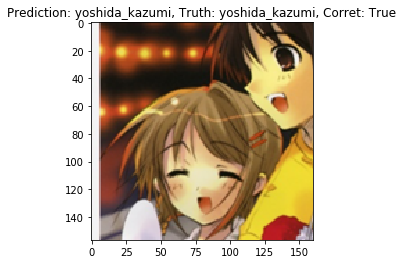

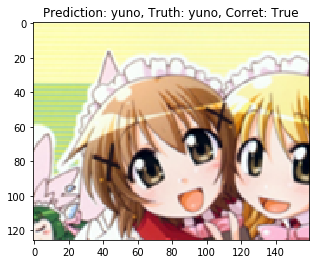

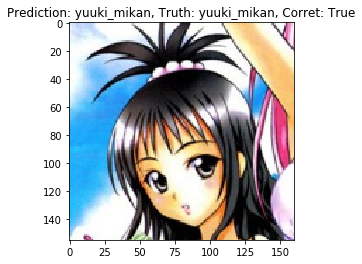

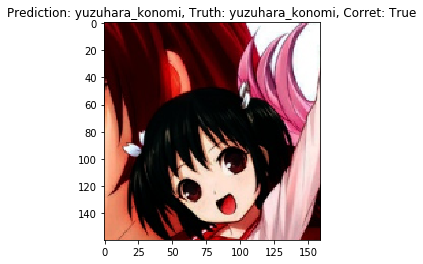

In [12]:
for key in models.keys():
    random_visualization(models[key])

In [7]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['test']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(character_names[preds[j]]))
                loader_gen.loader_display(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

model name: rn18


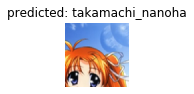

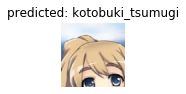

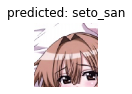

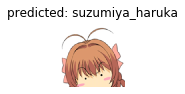

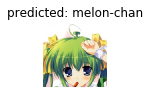

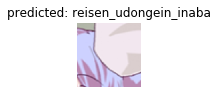

In [8]:
for key in models.keys():
    print("model name: {}".format(key))
    visualize_model(models[key])

In [7]:
def confusion_matrix(model, n_class, normalize=True):
    model.eval()
    confusion_matrix = torch.zeros(n_class, n_class)
    with torch.no_grad():
        for i, (inputs, classes) in enumerate(dataloaders['test']):
            inputs = inputs.to(device)
            classes = classes.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            for t, p in zip(classes.view(-1), preds.view(-1)):
                    confusion_matrix[t.long(), p.long()] += 1
    confusion_matrix = confusion_matrix.numpy()
    if normalize:
        confusion_matrix = confusion_matrix/confusion_matrix.sum(axis=1)
    return confusion_matrix

def plot_cm(cm, class_label, title="Confusion Matrix"):
    df_cm = pd.DataFrame(cm, class_label, class_label)
    # plt.figure(figsize=(10,7))
    sn.set(font_scale=1.4) # for label size
    chart = sn.heatmap(df_cm, cmap=plt.cm.Blues, annot=True, annot_kws={"size": 12})
    chart.set_xticklabels(chart.get_xticklabels(), rotation=90, horizontalalignment='center')
    plt.title(title)
    plt.show()

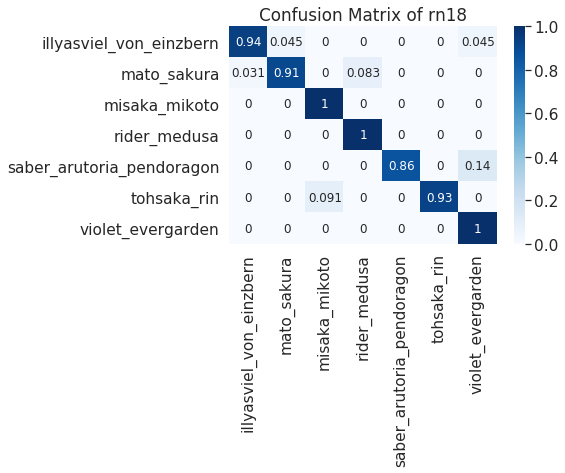

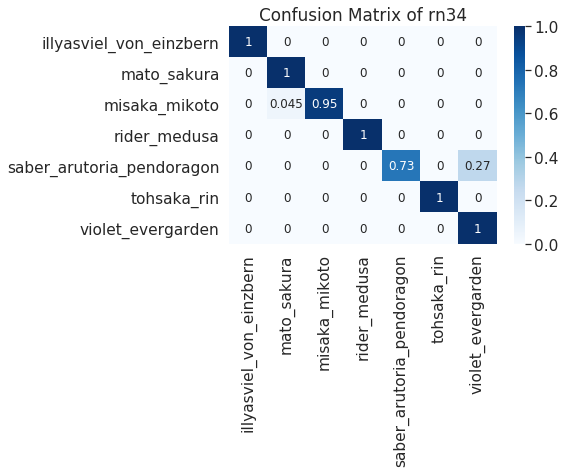

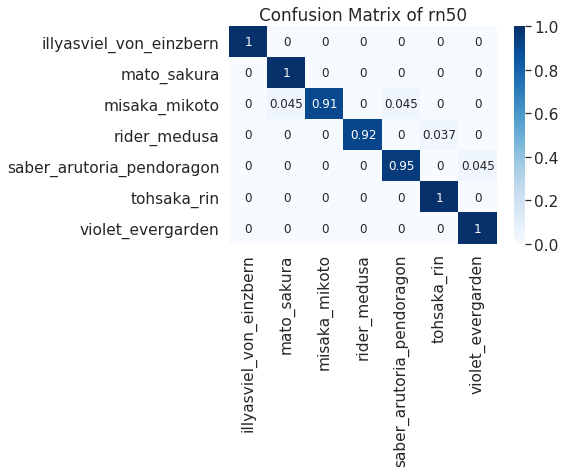

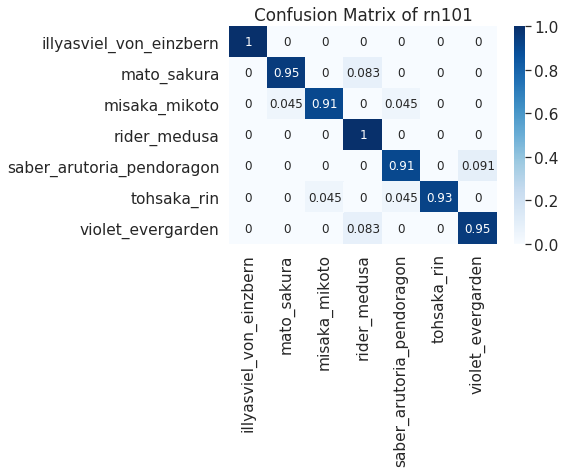

In [8]:
for key in models.keys():
    model = models[key]
    cm = confusion_matrix(model, len(character_names))
    plot_cm(cm, character_names, "Confusion Matrix of {}".format(key))